# LetsGrowMore Virtual Internship Program

# LGMVIP-Data Science Internship-July-23

# By: Rajvi Mevada

# Task-1: Exploratory Data Analysis on Dataset - Terrorism (Intermediate level task)

## Problem Statement

As a security/defense analyst, try to find out the hot zone of terrorism.
You can choose any of the tool of your choice  
(Python/R/Tableau/PowerBI/Excel/SAP/SAS)

## Exploratory Data Analysis:

Exploratory Data Analysis (EDA) refers to the critical process of performing initial investigations on data so as to discover patterns,to spot anomalies,to test hypothesis and to check assumptions with the help of summary statistics and graphical representations.

### **Importing all the important Libraries**

In [194]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns 
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter

import warnings
warnings.filterwarnings('ignore')

### **Loading Dataset**

In [195]:
# Read the CSV file
dataset=pd.read_csv('globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')
dataset.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


### Understanding Dataset

In [196]:
# Shape of Dataset
dataset.shape

(181691, 135)

In [197]:
# Dataset Columns
dataset.columns.values

array(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region', 'region_txt',
       'provstate', 'city', 'latitude', 'longitude', 'specificity',
       'vicinity', 'location', 'summary', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'alternative', 'alternative_txt', 'multiple',
       'success', 'suicide', 'attacktype1', 'attacktype1_txt',
       'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt',
       'targtype1', 'targtype1_txt', 'targsubtype1', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1', 'natlty1_txt', 'targtype2',
       'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2',
       'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt',
       'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3',
       'natlty3_txt', 'gname', 'gsubname', 'gname2', 'gsubname2',
       'gname3', 'gsubname3', 'motive', 'guncertain1', 'guncertain2',
       'guncertain3', 'in

In [198]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [199]:
dataset.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [200]:
dataset.corr()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
eventid,1.000000,0.999996,0.002706,0.018336,0.091761,-0.135039,0.401371,0.166886,0.003907,0.030641,...,-0.009990,-0.018001,-0.014094,-0.165422,0.256113,-0.181612,-0.143600,-0.133252,-0.077852,-0.175605
iyear,0.999996,1.000000,0.000139,0.018254,0.091754,-0.135023,0.401384,0.166933,0.003917,0.030626,...,-0.009984,-0.018216,-0.014238,-0.165375,0.256092,-0.181556,-0.143601,-0.133253,-0.077847,-0.175596
imonth,0.002706,0.000139,1.000000,0.005497,-0.000468,-0.006305,-0.002999,-0.015978,-0.003880,0.003621,...,-0.000710,0.046989,0.058878,-0.016597,0.011295,-0.011535,-0.002302,-0.002034,-0.002554,-0.006336
iday,0.018336,0.018254,0.005497,1.000000,-0.004700,0.003468,0.009710,0.003423,-0.002285,-0.006991,...,0.012755,-0.010502,0.003148,-0.006581,-0.006706,0.001765,-0.001540,-0.001621,-0.002027,-0.001199
extended,0.091761,0.091754,-0.000468,-0.004700,1.000000,-0.020466,0.038389,-0.024749,0.000523,0.057897,...,-0.008114,0.028177,0.001966,0.009367,0.233293,-0.192155,0.071768,0.075147,0.027335,0.080767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nreleased,-0.181612,-0.181556,-0.011535,0.001765,-0.192155,-0.044331,-0.149511,0.002790,-0.017745,-0.030631,...,0.054571,0.034843,0.049322,0.016832,-0.555478,1.000000,0.039388,0.040947,0.085055,0.064759
INT_LOG,-0.143600,-0.143601,-0.002302,-0.001540,0.071768,0.069904,-0.082584,-0.099827,0.002272,0.073022,...,0.035821,0.031079,0.007029,-0.045504,-0.015442,0.039388,1.000000,0.996211,0.052537,0.891051
INT_IDEO,-0.133252,-0.133253,-0.002034,-0.001621,0.075147,0.067564,-0.071917,-0.094470,0.002268,0.071333,...,0.039053,0.041983,0.013162,-0.039844,-0.016234,0.040947,0.996211,1.000000,0.082014,0.893811
INT_MISC,-0.077852,-0.077847,-0.002554,-0.002027,0.027335,0.207281,0.043139,0.097652,0.000371,-0.019197,...,0.023815,0.125162,0.037227,0.129274,-0.119776,0.085055,0.052537,0.082014,1.000000,0.252193


### **Cleaning Data**

In [201]:
#Rename the necessary columns

dataset.rename(columns=
               {'iyear':'Year','imonth':'Month','city':'City','iday':'Day','country_txt':'Country',
                'region_txt':'Region','provstate':'State','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                'weaptype1_txt':'Weapon_type','motive':'Motive', 'success': 'Success'},inplace=True)


In [202]:
dataset=dataset[['Year','Month','Day','Country','Region','State', 'City','latitude','longitude','AttackType','Killed',
                 'Wounded','Target','Group','Target_type','Weapon_type', 'Success']]

In [203]:
dataset.head(10)

,Year,Month,Day,Country,Region,State,City,latitude,longitude,AttackType,Killed,Wounded,Target,Group,Target_type,Weapon_type,Success
0,1970,7,2,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown,1
1,1970,0,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown,1
2,1970,1,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,Unknown,Journalists & Media,Unknown,1
3,1970,1,0,Greece,Western Europe,Attica,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives,1
4,1970,1,0,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary,1
5,1970,1,1,United States,North America,Illinois,Cairo,37.005105,-89.176269,Armed Assault,0.0,0.0,Cairo Police Headquarters,Black Nationalists,Police,Firearms,1
6,1970,1,2,Uruguay,South America,Montevideo,Montevideo,-34.891151,-56.187214,Assassination,0.0,0.0,Juan Maria de Lucah/Chief of Directorate of in...,Tupamaros (Uruguay),Police,Firearms,0
7,1970,1,2,United States,North America,California,Oakland,37.791927,-122.225906,Bombing/Explosion,0.0,0.0,Edes Substation,Unknown,Utilities,Explosives,1
8,1970,1,2,United States,North America,Wisconsin,Madison,43.076592,-89.412488,Facility/Infrastructure Attack,0.0,0.0,"R.O.T.C. offices at University of Wisconsin, M...",New Year's Gang,Military,Incendiary,1
9,1970,1,3,United States,North America,Wisconsin,Madison,43.072950,-89.386694,Facility/Infrastructure Attack,0.0,0.0,Selective Service Headquarters in Madison Wisc...,New Year's Gang,Government (General),Incendiary,1


In [204]:
dataset.columns

Index(['Year', 'Month', 'Day', 'Country', 'Region', 'State', 'City',
       'latitude', 'longitude', 'AttackType', 'Killed', 'Wounded', 'Target',
       'Group', 'Target_type', 'Weapon_type', 'Success'],
      dtype='object')

### **Handing Missing Vaues**

In [205]:
#Checking for Missing data:

dataset.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
State            421
City             434
latitude        4556
longitude       4557
AttackType         0
Killed         10313
Wounded        16311
Target           636
Group              0
Target_type        0
Weapon_type        0
Success            0
dtype: int64

In [206]:
dataset['Wounded'] = dataset['Wounded'].fillna(0)
dataset['Killed'] = dataset['Killed'].fillna(0)
dataset['Casualities'] = dataset['Killed'] + dataset['Wounded']

In [207]:
dataset['State'].fillna("unknown", inplace = True)
dataset['City'].fillna("unknown", inplace = True)

In [208]:
dataset.dropna(axis=0, inplace=True)

In [209]:
dataset.shape

(176536, 18)

In [210]:
#Re-Checking for Missing Data:
dataset.isnull().sum()

Year           0
Month          0
Day            0
Country        0
Region         0
State          0
City           0
latitude       0
longitude      0
AttackType     0
Killed         0
Wounded        0
Target         0
Group          0
Target_type    0
Weapon_type    0
Success        0
Casualities    0
dtype: int64

In [211]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176536 entries, 0 to 181690
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         176536 non-null  int64  
 1   Month        176536 non-null  int64  
 2   Day          176536 non-null  int64  
 3   Country      176536 non-null  object 
 4   Region       176536 non-null  object 
 5   State        176536 non-null  object 
 6   City         176536 non-null  object 
 7   latitude     176536 non-null  float64
 8   longitude    176536 non-null  float64
 9   AttackType   176536 non-null  object 
 10  Killed       176536 non-null  float64
 11  Wounded      176536 non-null  float64
 12  Target       176536 non-null  object 
 13  Group        176536 non-null  object 
 14  Target_type  176536 non-null  object 
 15  Weapon_type  176536 non-null  object 
 16  Success      176536 non-null  int64  
 17  Casualities  176536 non-null  float64
dtypes: float64(5), int64(4),

### **Observation**

In [212]:
print("Country with the most attacks:",dataset['Country'].value_counts().idxmax())
print("City with the most attacks:",dataset['City'].value_counts().index[1])
print("Region with the most attacks:",dataset['Region'].value_counts().idxmax())
print("Year with the most attacks:",dataset['Year'].value_counts().idxmax())
print("Month with the most attacks:",dataset['Month'].value_counts().idxmax())
print("Group with the most attacks:",dataset['Group'].value_counts().index[1])
print("Most Attack Types:",dataset['AttackType'].value_counts().idxmax())

Country with the most attacks: Iraq
City with the most attacks: Unknown
Region with the most attacks: Middle East & North Africa
Year with the most attacks: 2014
Month with the most attacks: 5
Group with the most attacks: Taliban
Most Attack Types: Bombing/Explosion


### Exploratory Data Analysis and visualization 

**WORDCLOUD FOR ALL THE STATES WITH MOST NUMBER OF ATTACKS**

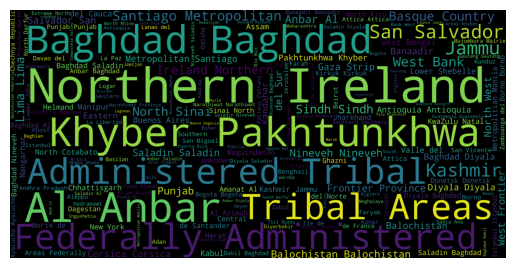

In [213]:
#wordcloud for all the states with most number of attacks
from wordcloud import WordCloud
cities = dataset['State'].dropna(False)
wordcloud = WordCloud(background_color = 'black',width = 4000,height = 2000).generate(' '.join(cities))
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

**YEARLY COUNT OF TERRORIST ATTACK**

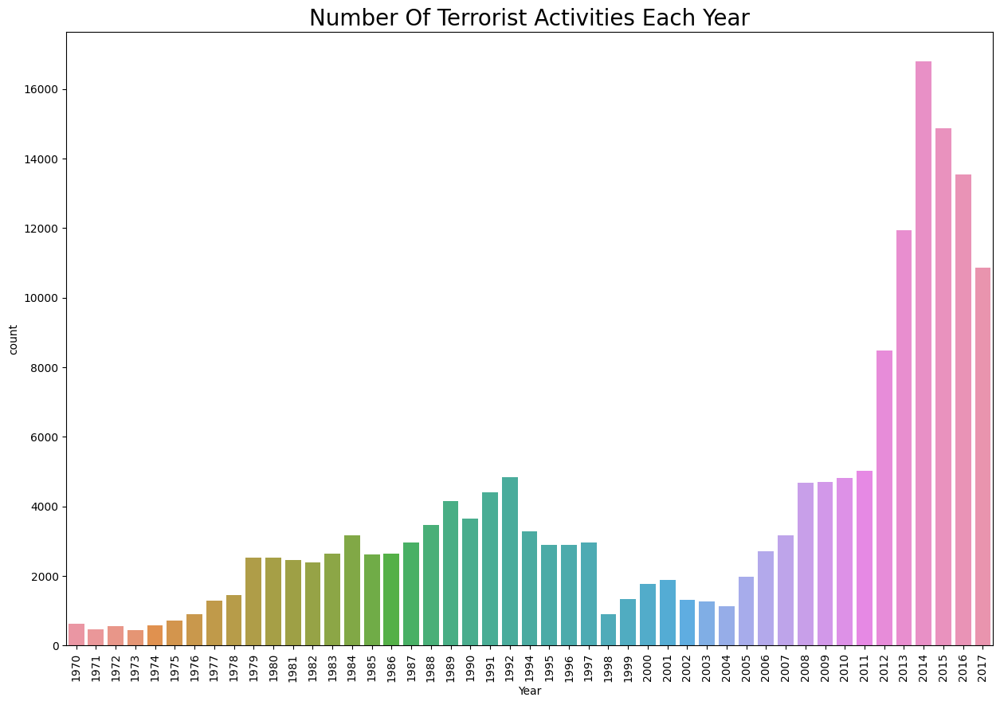

In [214]:
#Yearly Count of Terrorist Attack-
plt.figure(figsize=(15,10))
sns.countplot(x="Year", data=dataset)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year', size=20)
plt.show()
     

**Observation:**

From the graph we can see 2013-17 marks the highest attacks with 2014 having the highest.

There has been a gradual increase in Terror Activities since 2004.

Highest number of terror activities occurred in the year 2014.

After 2014 the terror activities started to decrease.

**MONTHLY COUNT OF TERRORIST ATTACK**

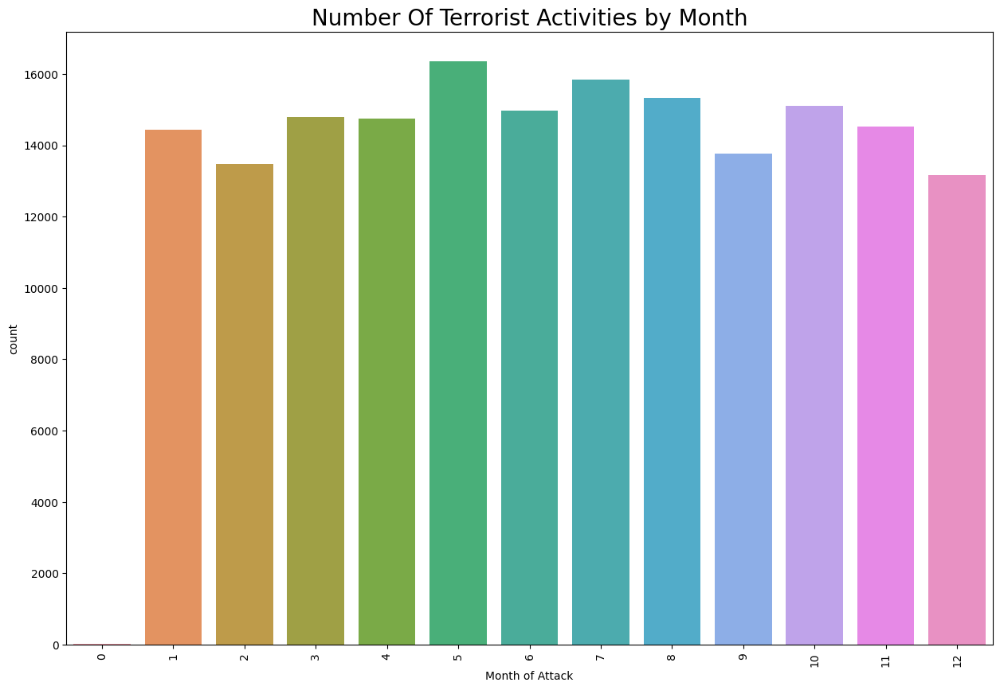

In [215]:
#month analysis
# dataset['Month'].value_counts()
plt.figure(figsize = (15, 10))
sns.countplot(x='Month', data = dataset)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities by Month', size=20)
plt.xlabel("Month of Attack")
plt.show()

**Observation:**

Highest number of attacks are in the month of May but there is not much of difference in number of attacks by month.

**COUNT OF PEOPLE DIED IN ATTACK BY YEAR**

Text(0.5, 1.0, 'PEOPLE DIED IN ATTACK')

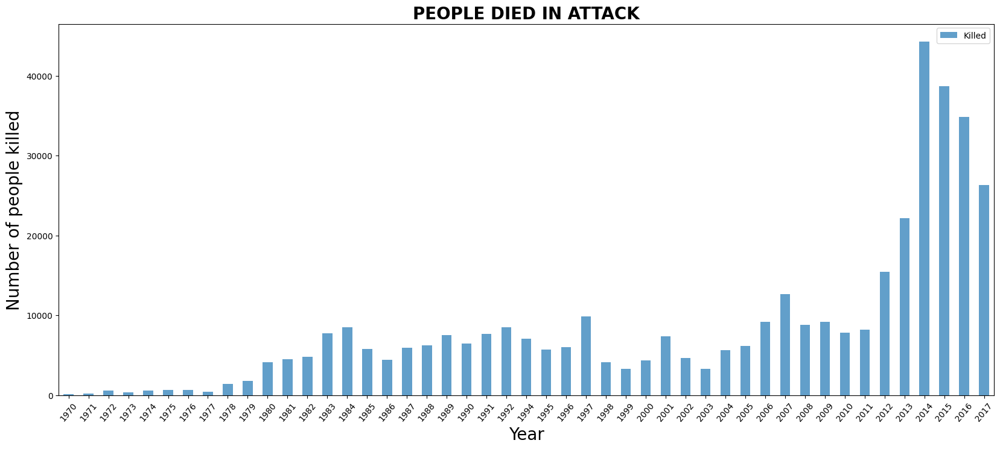

In [253]:
df = dataset[['Year','Killed']].groupby(['Year']).sum()
fig, ax4 = plt.subplots(figsize=(20,8))
df.plot(kind='bar',alpha=0.7,ax=ax4)
plt.xticks(rotation = 50)
plt.ylabel("Number of people killed",size=20)
plt.xlabel('Year',fontsize=20)
plt.title("PEOPLE DIED IN ATTACK",size=20,fontweight="bold")

**Onservation:**

In 2014, the most number of people died.
 We can also conclude this by seeing there was HIghest Number of attacks were occured in year 2014

**MOST EFFECTED CITIES BY ATTACK**

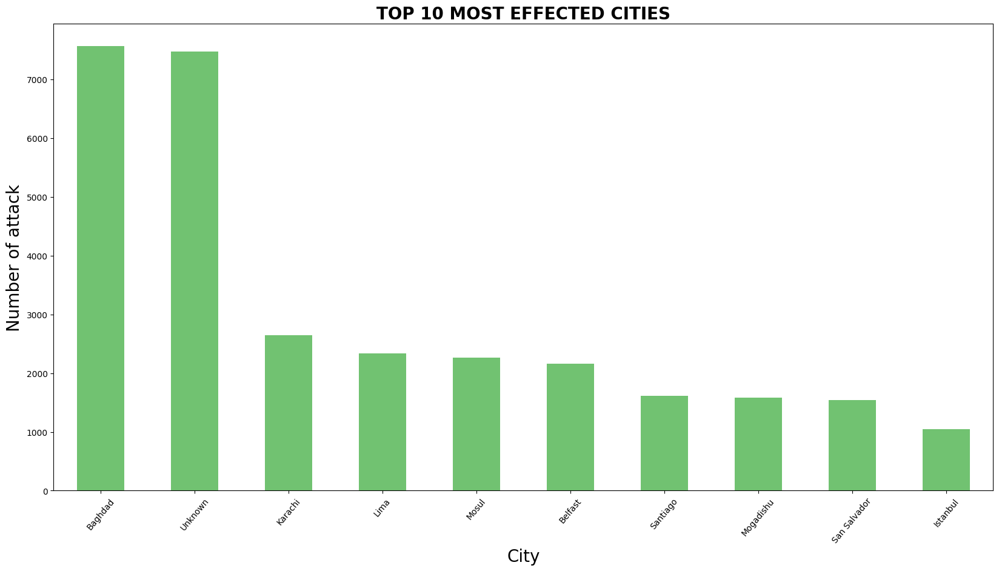

In [255]:
city_counts = dataset['City'].value_counts()

# Select the top 10 cities with the highest counts
top_cities = city_counts.head(10)

# Create a bar plot to visualize the counts
top_cities.plot(kind='bar', figsize=(20, 10), color=(0.3, 0.7, 0.3, 0.8))
plt.xticks(rotation = 50)
plt.xlabel("City",fontsize=20)
plt.ylabel("Number of attack",fontsize=20)
plt.title("TOP 10 MOST EFFECTED CITIES",size=20,fontweight="bold")
plt.show()

**Observation:**

Bagdad is the most effected city follwed by Karanchi and Lima by Terrorism 

**ANALYSIS OF GROUP, COUNTRY, AND NUMBER OF PEOPLE KILLED BY GROUPS**

In [256]:
df=dataset[['Country','Group','Killed']]
df=df.groupby(['Group','Country'],axis=0).sum().sort_values('Killed',ascending=False).head(15)
df

,,Killed
Group,Country,
Unknown,Iraq,38135.0
Islamic State of Iraq and the Levant (ISIL),Iraq,30998.0
Taliban,Afghanistan,29222.0
Boko Haram,Nigeria,16912.0
Unknown,Pakistan,11903.0
Liberation Tigers of Tamil Eelam (LTTE),Sri Lanka,10612.0
Shining Path (SL),Peru,10118.0
Al-Shabaab,Somalia,8174.0
Farabundo Marti National Liberation Front (FMLN),El Salvador,7537.0


**Observation:**
    
It is observer that most number of attacks were done by unknown group or not an group terrorist

**ANALYSIS OF NUMBER OF PEOPLE KILLED BY ATTACK TYPE**

In [219]:
KillType = dataset.pivot_table(columns='AttackType', values='Killed', aggfunc='sum')
KillType

AttackType,Armed Assault,Assassination,Bombing/Explosion,Facility/Infrastructure Attack,Hijacking,Hostage Taking (Barricade Incident),Hostage Taking (Kidnapping),Unarmed Assault,Unknown
Killed,149113.0,23866.0,154593.0,3577.0,3588.0,4437.0,23605.0,821.0,30210.0


**Observation:**

Most number of pepple are killed by Armed Assault

**ANALYSIS OF SUCCESS AND FAILURE OF TERRORIST ATTACKS OVER THE YEARS**

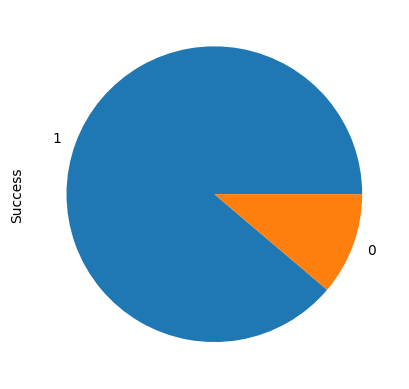

In [220]:
dataset['Success'].value_counts().plot(kind='pie')
plt.show()

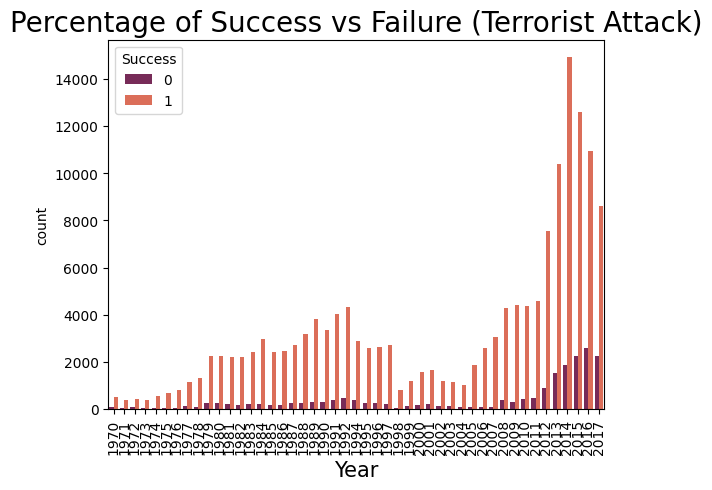

In [221]:
#using countplot with year and success
sns.countplot(x ='Year', hue = "Success", data = dataset,palette='rocket')
plt.title("Percentage of Success vs Failure (Terrorist Attack)",fontsize=20)
plt.xticks(rotation = 90)
plt.xlabel("Year",fontsize=15)
plt.show()

**Observation:**

In 2014 most number of attacks are succeed and in 2016 most number of attacks are failed

**ANALYSIS OF WORST TERROR ATTACKS IN HISTORY FROM 1982 TO 2016**

In [223]:
#Values are sorted by the top 40 worst terror attacks as to keep the heatmap simple and easy to visualize
terror1 = dataset.sort_values(by='Casualities',ascending=False)[:40]

In [224]:
heat=terror1.pivot_table(index='Country',columns='Year',values='Casualities')
heat.fillna(0,inplace=True)

In [225]:
heat

Year,1982,1984,1992,1994,1995,1996,1997,1998,2001,2004,2005,2006,2007,2008,2009,2014,2015,2016,2017
Country,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.000000,536.0,0.000000,584.0
Chad,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,1161.0,0.0,0.000000,0.0,0.000000,0.0
Ethiopia,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,520.000000,0.0
India,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,1005.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
Iran,760.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
Iraq,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,702.0,0.0,833.333333,0.0,654.0,1064.333333,0.0,911.666667,0.0
Japan,0.0,0.0,0.0,507.0,3092.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
Kenya,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4224.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0


In [226]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
colorscale = [[0, '#edf8fb'], [.3, '#A52A2A'],  [.6,'#76EE00'],  [1, '#008B8B']]
heatmap = go.Heatmap(z=heat.values, x=heat.columns, y=heat.index, colorscale=colorscale)
data = [heatmap]
layout = go.Layout(
    title='Top 40 Worst Terror Attacks in History from 1982 to 2016',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap',show_link=False)

**Observation:**

US is the country having Worst Terror Attacks.It has total 9574 attacks in 2001.

**REGION AFFECTED BY TERRORIST ATTACK**

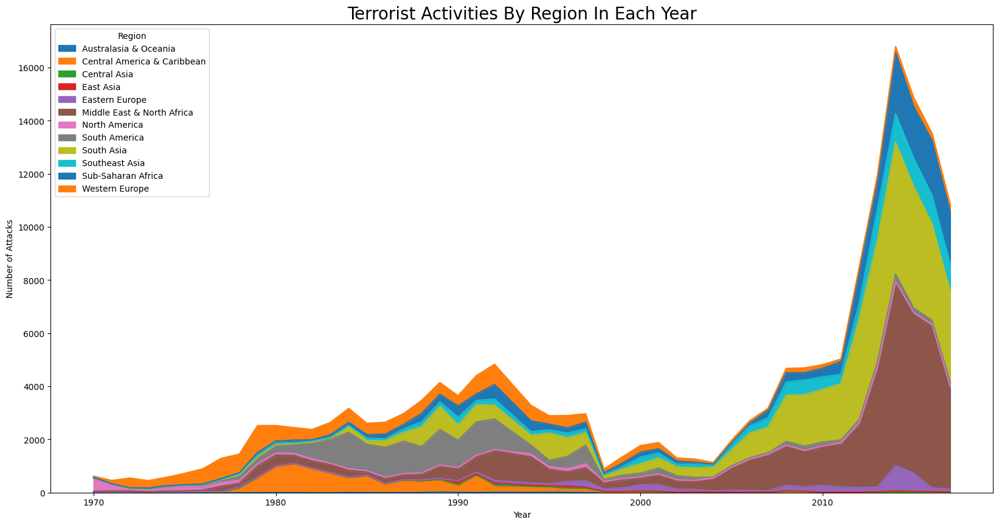

In [257]:
#Terrorist Activities By Region In Each Year
# Create a crosstab of Year and Region
crosstab_df = pd.crosstab(dataset.Year, dataset.Region)

# Plotting the area chart
crosstab_df.plot(kind='area', figsize=(20,10))
plt.title('Terrorist Activities By Region In Each Year', size='20')
plt.ylabel('Number of Attacks')
plt.show()

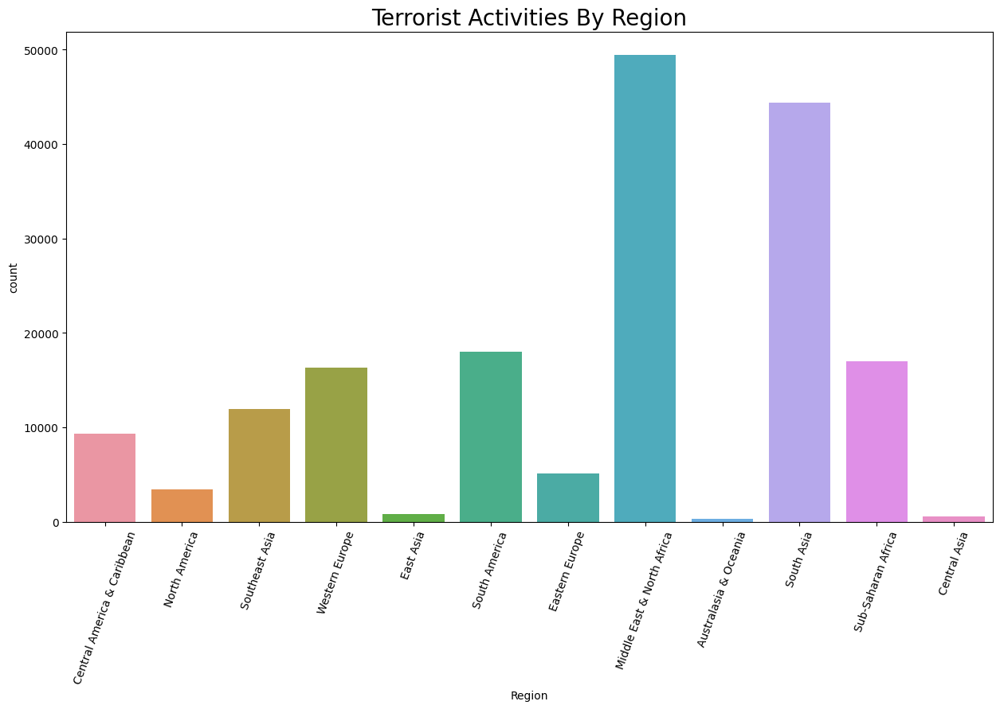

In [258]:
#REGION AFFECTED BY TERRORIST ATTACK
dataset['Region'].value_counts()
plt.figure(figsize=(15,8))
sns.countplot(x='Region',data=dataset)
plt.xticks(rotation=70)
plt.title('Terrorist Activities By Region', size='20')
plt.show()

In [261]:
#Count of Terror Attack Region-Wise.
region_attacks = dataset.Region.value_counts().to_frame().reset_index()
region_attacks.columns = ['Region', 'Total Attacks']
fig = px.bar_polar(data_frame=region_attacks,r = 'Total Attacks',theta='Region',color = 'Region',
                  template="ggplot2", color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.update_layout(title='Total Terrorist Attacks by Region',
                  title_font=dict(size=20))
fig.show()

**Observation:**

Middle East and North Africa shows the highest followed by South Asia.

**COUNTRIES WITH MOST NUMBER OF ATTACKS**

In [245]:
dataset['Country'].value_counts()[:15]#countries with most number of attacks

Iraq              24445
Pakistan          14298
Afghanistan       12624
India             11761
Colombia           7819
Philippines        6525
Peru               5772
United Kingdom     5212
El Salvador        4819
Turkey             4118
Somalia            4115
Nigeria            3861
Thailand           3800
Yemen              3270
Spain              3168
Name: Country, dtype: int64

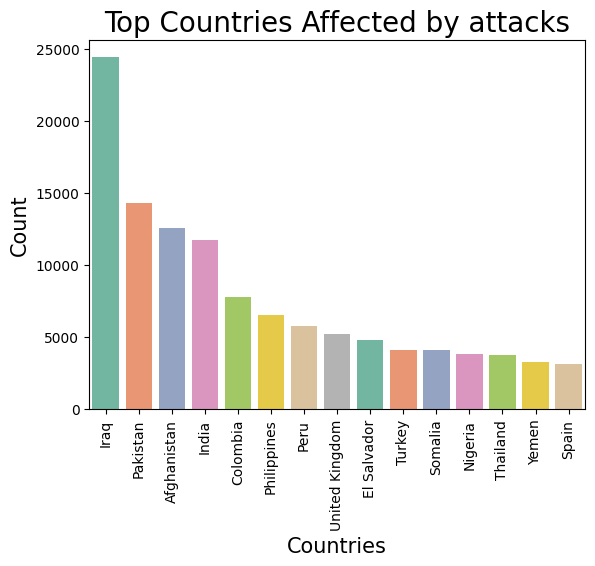

In [246]:
#COUNTY AFFECTED BY TERRORIST ATTACK
country_counts = dataset['Country'].value_counts()[:15]

sns.barplot(x=country_counts.index, y=country_counts.values, palette='Set2')
plt.title('Top Countries Affected by attacks',fontsize=20)
plt.xlabel('Countries',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.xticks(rotation= 90)
plt.show()

**Observation:**

Iraq, again the highest followed by Pakistan, Afganistan and India.

**ANALYSIS OF CASUALITIES BY YEAR**

In [262]:
#Counting the Yearly Casualities-
import plotly.express as px

# Grouping the dataset by Year and summing the Casualties
year_cas = dataset.groupby('Year').Casualities.sum().to_frame().reset_index()
year_cas.columns = ['Year', 'Casualties']

# Creating a bar plot
fig = px.bar(data_frame=year_cas, x='Year', y='Casualties', color='Casualties', template='plotly_dark')

# Setting the title of the graph and its font size
fig.update_layout(title='Total Casualties by Year', title_font=dict(size=20))

# Displaying the graph
fig.show()


**Observation:**

It is observed that 2015 marks the highest Casualities records.

**ANALYSIS OF TYPE OF TARGET ATTACKS**

In [263]:
#Type of Target Attacks
target = list(dataset['Target_type'])
target_map = dict(Counter(target))
target_df = pd.DataFrame(target_map.items())
target_df.columns = ['Target Type','Count']
fig=px.bar(data_frame=target_df,x = 'Target Type',y = 'Count',color='Target Type',template='plotly_white')
fig.update_layout(title='Type of target attack', title_font=dict(size=20))

**Observation:**

Private Citizens and Property Counts the highest amongst all.

**COUNTING THE CASUALTIES ACCORDING TO THE ATTACK TYPE**

In [232]:
#Counting the Casuallities according the Attack Type
AttackType=dataset.pivot_table(columns='AttackType',values='Casualities',aggfunc='sum')
AttackType = AttackType.T
AttackType['Type'] = AttackType.index

In [264]:
#plotting the Attack Type
labels = AttackType.columns.tolist()
attack=AttackType.T
values=attack.values.tolist()
values = sum(values,[])
attack_type = list(dataset['AttackType'].unique())
fig = go.Figure(data=[go.Pie(labels = attack_type,values=values,hole=.3)])
fig.update_layout(title='Casualties by attack type', title_font=dict(size=20))
fig.update_layout(template = 'gridon')
fig.show()

Text(0.5, 1.0, 'Favorite Targets')

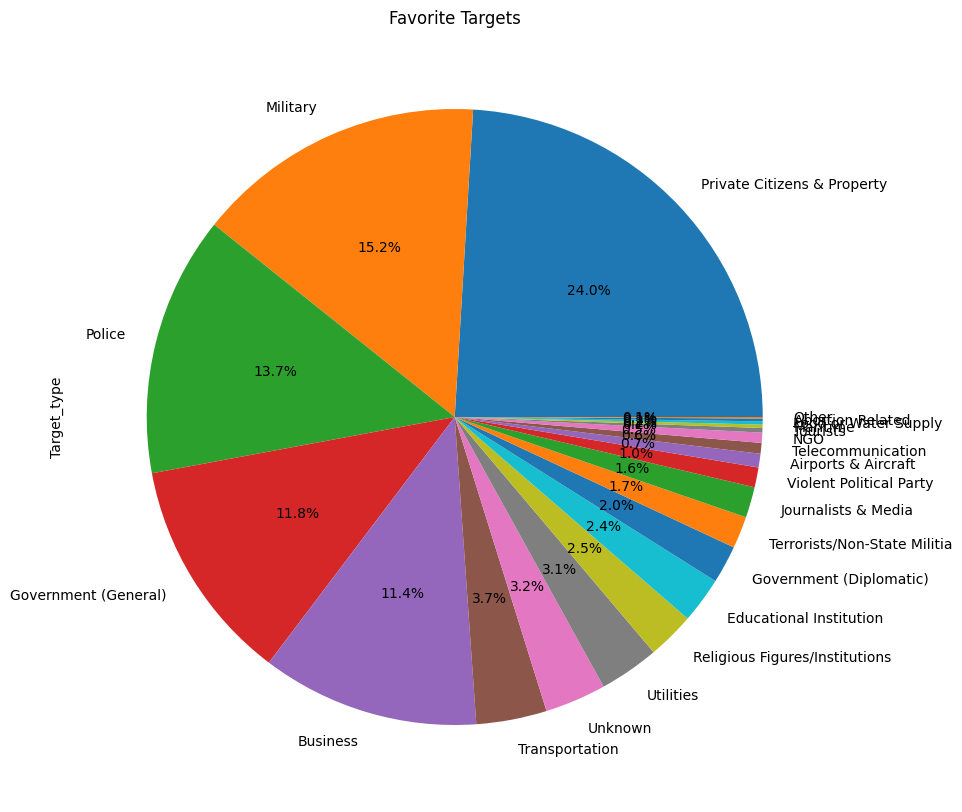

In [234]:
dataset['Target_type'].value_counts().plot(kind='pie',figsize=[12,10],autopct='%1.1f%%')
plt.title('Favorite Targets')

**Observation:**

Most casualities are done by Bombing and Explosion method and done on Private citizens and properties

In [265]:
# Count of Weapon Chssen for Attack.
from collections import Counter
values = list(dataset['AttackType'])
value_map = dict(Counter(values))
value_dataset = pd.DataFrame(value_map.items())
value_dataset.columns = ["AttackType","Count of Attack Type"]
fig=px.bar(data_frame=value_dataset,x = 'AttackType',y = 'Count of Attack Type',color = 'AttackType',template="plotly_white")
fig.update_layout(title='Count of Weapon Chssen for Attack', title_font=dict(size=20))

<Axes: ylabel='Weapon_type'>

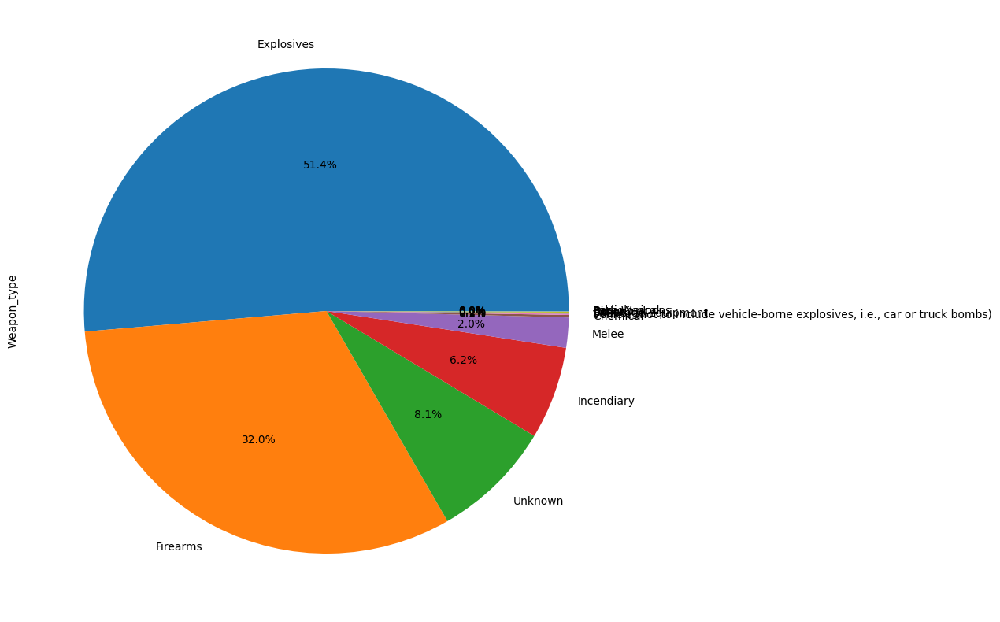

In [236]:
dataset['Weapon_type'].value_counts().plot(kind='pie',figsize=[15,10],autopct='%1.1f%%')

**Observation:**

Again, Bombing and Explosion shows the highest.

**ANALYSIS OF REGION VS. WEAPON_TYPE**

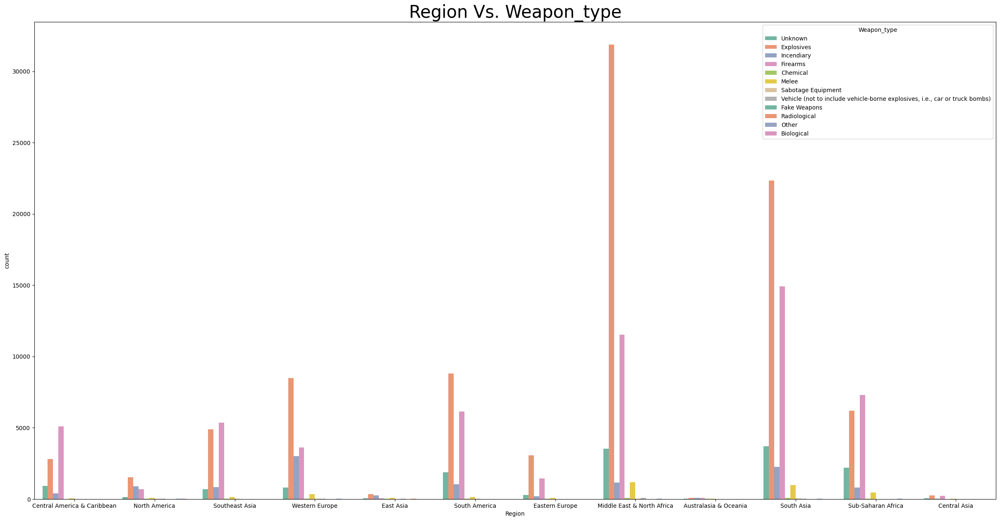

In [237]:
#Region Vs. Weapon_type
plt.subplots(figsize = (30,15))
sns.countplot(x="Region", hue ='Weapon_type', data = dataset,palette = "Set2")
plt.title('Region Vs. Weapon_type', fontsize = 30)
plt.show()

**ANALYSIS OF GROUP VS. WEAPON_TYPE**

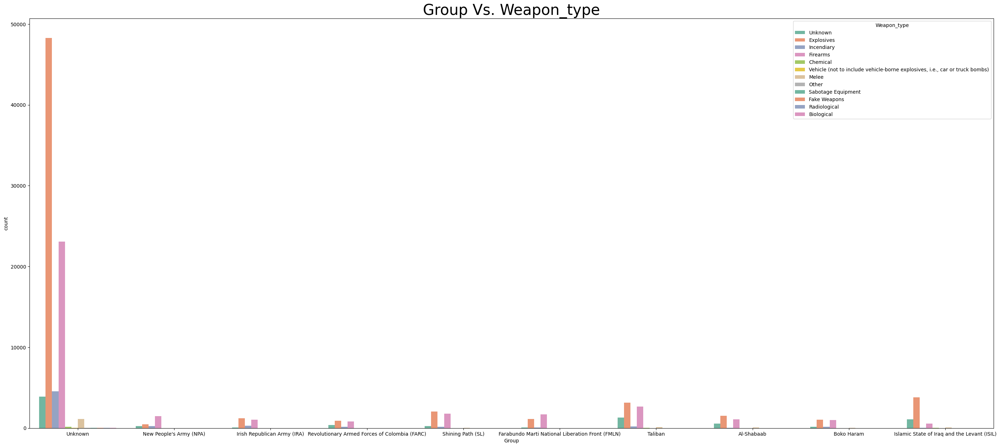

In [238]:
#Group Vs. Weapon_type
plt.subplots(figsize = (35,15))
Top_10_Group = dataset['Group'].value_counts().index.tolist()[0:10]
snap = dataset[['Group','Weapon_type']]
AttackG_Weapon = snap[snap['Group'].isin(Top_10_Group)]
sns.countplot(x='Group', hue ='Weapon_type', data = AttackG_Weapon,palette = "Set2")
plt.title('Group Vs. Weapon_type', fontsize = 30)
plt.show()

**TOP 10 GROUP TREND**

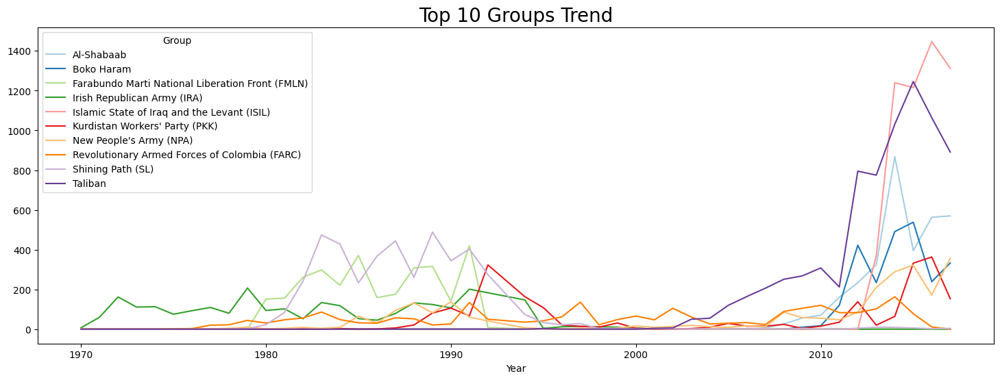

In [266]:
#Top 10 Groups Trend
top_groups10=dataset[dataset['Group'].isin(dataset['Group'].value_counts()[1:11].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('Paired',15))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.title("Top 10 Groups Trend", size='20')
plt.show()

**Observation:**

It is observed that after 2010 ISIL group is top doing terriost attack

**PLOTTING THE HOT-ZONE OF TERRORISM ON THE HIGHEST YEAR OF TERRORIST ATTACK i.e. 2014**

In [241]:
# Plotting the HOT-ZONE of Terrorism on the highest year of Terrorist Attack i.e. 2014.
import folium
from folium.plugins import MarkerCluster
year=dataset[dataset['Year']==2014]
mapData=year.loc[:,'City':'longitude']
mapData=mapData.dropna().values.tolist()

map = folium.Map(location = [0, 50], tiles='CartoDB positron', zoom_start=2) 
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(mapData)):
    folium.Marker(location=[mapData[point][1],mapData[point][2]],
                  popup = mapData[point][0]).add_to(markerCluster)
map

**Observation:**

Iraq shows the highest Terror Attacks followed by other Middle-east region.

**ANALYSIS OF TOTAL NUMBER OF CASUALTIES IN EACH COUNTRY**

In [268]:
#Counting the Total Number of Casualities in each Country.
plt.figure(figsize=(15, 8))
cas_count= dataset.groupby("Country").Casualities.sum().to_frame().reset_index().sort_values("Casualities", ascending=False)[:15]
fig=px.bar(data_frame=cas_count,x = 'Country',y = 'Casualities',color='Country',template='plotly_white')
fig.update_layout(title='Total Number of Casualities in each Country', title_font=dict(size=20))

<Figure size 1500x800 with 0 Axes>

**Observation:**

It is observed that Iraq is the country havif most number of attacks.

# Conclusion

Hot zones of terrorism is Middle east and North Arica so,we should focus in these region.

Iraq, Afganistan and Pakistan most suffered country, Government should be aware from the citizens of these countries.

Terrorist like to target Private citizens, Army and Police mostly, Security should be tighten in all these areas.

BOMBING and EXPLOSIVE are most used weapon and attack type b=used by terrorist

Government should tighten borders and should strict arms law.

Most number of attacks were done by unknown group or not an group terrorist

All country should have to make pact to to tackle terrorism because after 2005 there is rapid increase in Terrorist 
Activites.